# Detectie van gezichten

- Minor Applied Artificial Intelligence, Hogeschool van Amsterdam (AUAS)
- Lecturers: Frank Aldershoff & Michiel Bontenbal 
- Date: Thursday February 9 2023


### Goal of this notebook
In this notebook we will use Numpy and OpenCV to detect objects, faces, in images. 

You will:
- learn how an image/video can be converted to data as a Numpy array.
- learn that Numpy array is a fast datatype that can be used for deep learning.


### Contents
0. Import modules
1. Convert images to Numpy arrays
2. Which one is faster? Numpy arrays vs python lists

----
### Sources & further reading:
 
**Python Data Science Handbook - Jake Vanderplas**

Chapter 2. Introduction to NumPy
- https://learning.oreilly.com/library/view/python-data-science/9781491912126/ch02.html#introduction-to-numpy

**Deep Learning with Python - Francois Chollet**
- https://learning-oreilly-com.rps.hva.nl/library/view/deep-learning-with/9781617296864/


### NumPy tutorials

You can start your learning journey by looking at the following material:
- https://numpy.org/devdocs/user/quickstart.html
- https://www.w3schools.com/python/numpy/default.asp

----
Acknowledgements: Stijn Oomes

## 0. Importeer libraries

Importeer de relevante libraries.

`opencv` en `numpy`en `matplotlib` (`PIL` voor de zekerheid)

In [11]:
import cv2 as cv

import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

from PIL import Image

In [12]:
print(cv.__version__)

4.7.0


## 1. Importeer en toon een afbeelding

OpenCV kan beelden inlezen, maar de MatPlotLibrary ook; vanwege heel rare en ingewikkelde problemen is het makkelijker om MatPlotLib te gebruiken. Gebruik het commando ```plt.imread('path-to-image')``` om een plaatje in te lezen.

Met MatPlotLib kan je dan ook het plaatje tonen in je notebook. Dit doe je met het commando ```imshow(image)```; ```plt.figure(figsize=(10,10))``` geeft de beeldverhoudingen aan, vierkant in dit geval, en ```plt.axis('off');``` zorgt dat er geen x- en y-as getekend worden, want dat zou er raar uitzien bij een plaatje.

Je moet zelf het pad naar een plaatje op jouw computer invullen.

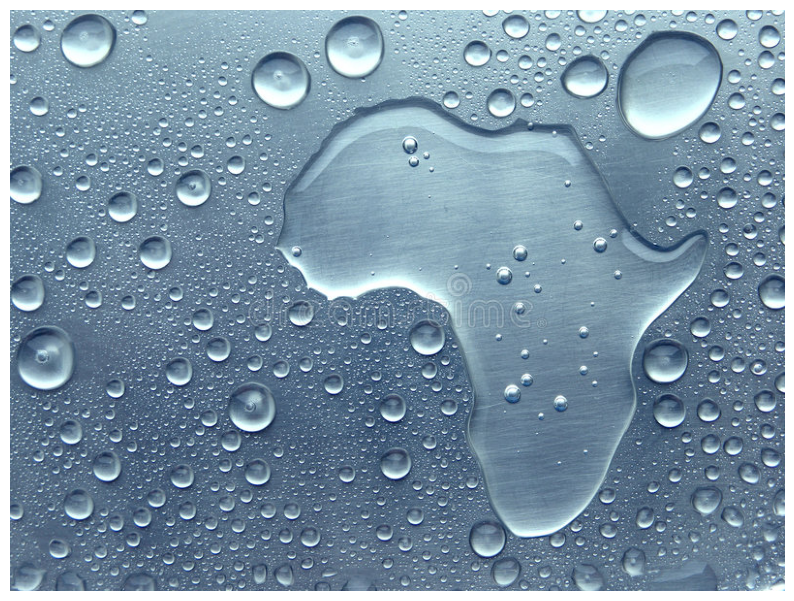

In [15]:
#open image an convert to numpy array
img = plt.imread('assets/image.jpg')  # select an image from the web/your pc 

plt.figure(figsize=(10,10))
plt.imshow(img)
plt.axis('off');

OpenCV heeft ook funkties om de kleur, kleurruimte, van plaatjes te veranderen; ```COLOR_RGB2GRAY``` gaat dus van RGB (kleur) naar gray (grijswaarden). Met het commando ```plt.imshow(gray, cmap='gray')``` zorg je ervoor dat er grijswaarden in de plot gebruikt worden, anders kiest matPlotLib een stadaard kleurenschema dat niet grijs is, een soort geel radarscherm kleurschema...

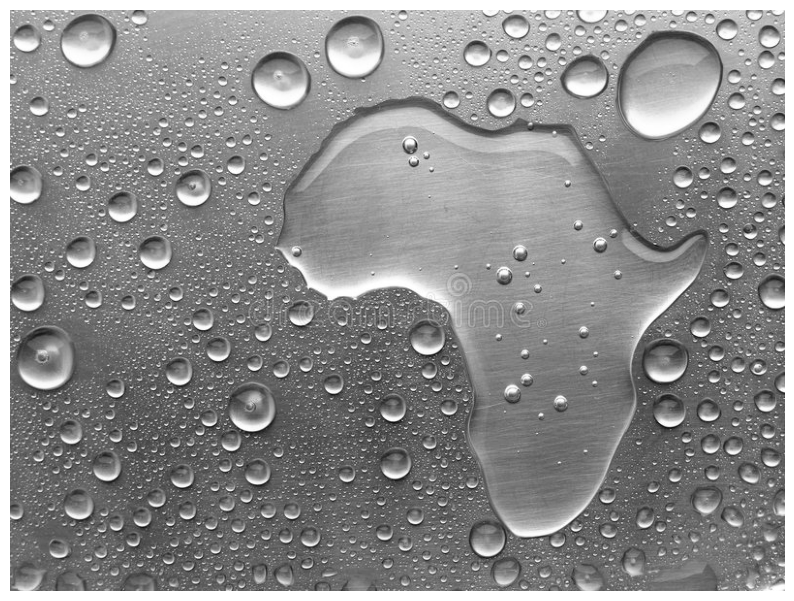

In [16]:
gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)

plt.figure(figsize=(10,10))
plt.imshow(gray, cmap='gray')
plt.axis('off');

## Edge Detection in OpenCV

Een veel voorkomende bewerking in Computer Vision is het herkennen van randen in plaatjes. We gebruiken nu het Canny algoritme, omdat dat een van de meest gebruikte algoritmes is. Hoe Canny werkt, zal ik later nog een keer uitleggen, nu dient het gewoon als voorbeeld van edge-detection.

Het commando is ```cv.Canny(gray, 10, 40, 3, 3, True)```, waarbij ```gray``` het input plaatje is, de 10 en 40 grenzen zijn wanneer een rannd herkend wordt; je kan hier wat mee spelen. De twee 3-en zijn de grootte van het filter dat gebruikt wordt en de ```True``` zorgt ervoor dathet geavanceerde algoritme gebruikt wordt. De4ze waarden werken goed voor mijn plaatje en vast ook voor jou. Kijk anders in de documentatie van OpenCV hoe je de waarden kan aanpassen.

In [86]:
edges = cv.Canny(gray, 40, 250, 3, 3, True)

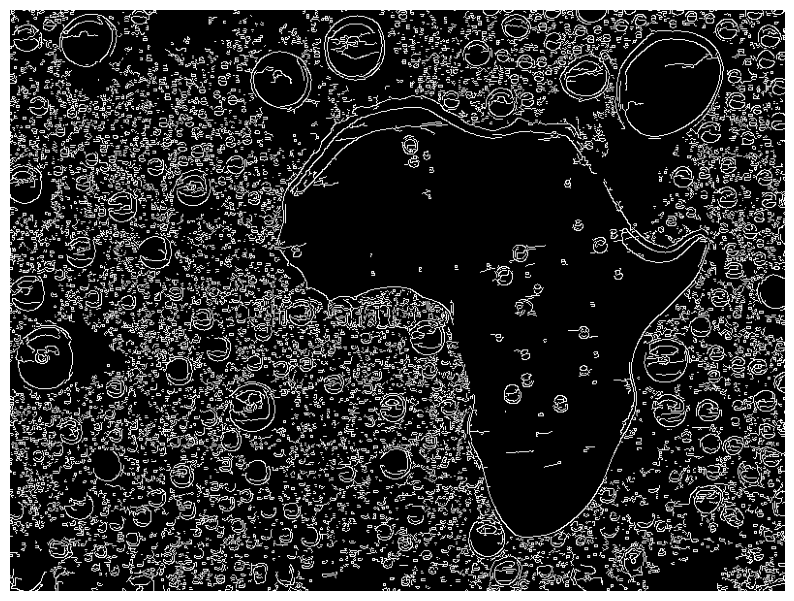

In [87]:
plt.figure(figsize=(10,10))
plt.imshow(edges, cmap='gray')
plt.axis('off');

Je kan Canny ook op een kleurenplaatje toepassen.

In [90]:
colour_edges = cv.Canny(img, 40, 250, 3, 3, True)

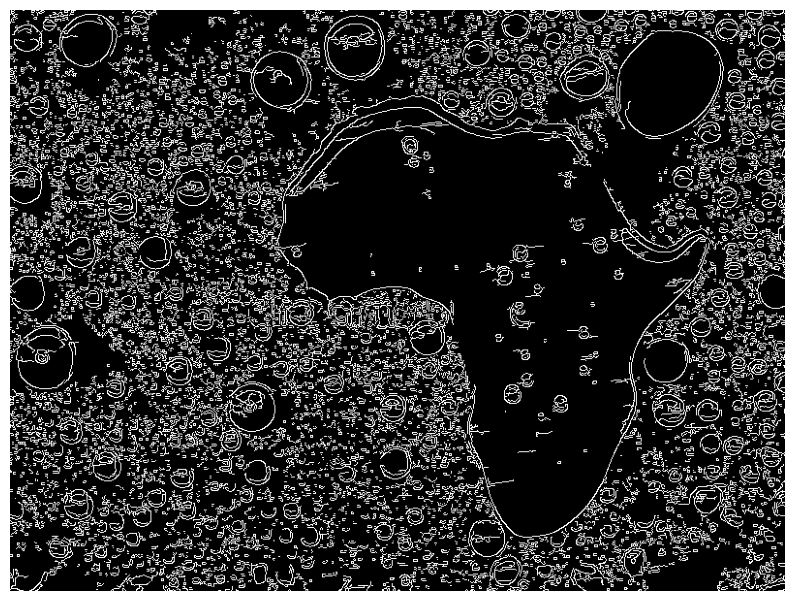

In [91]:
plt.figure(figsize=(10,10))
plt.imshow(colour_edges, cmap='gray')
plt.axis('off');

### Andere Kleurruimtes

Zoals je gezien hebt, zitten er best wat *foute* edges bij. Ook maakt de edge detector geen onderscheid tussen schaduwrandenof highlights en de *echte* randen van het object.

Zouden we hier wat aan kunnen doen?

*HSV*, Hue, Saturation en Value, is een adere manier om kleuren te beschrijven; je kent het misschien van PhotoShop. Hue is tint, Saturation is hoeveel van die tint er in zit, en Value is de helderheid. Zoals je ieronder zal zien, is Value (bijna) gelijk aan een grijswaarden plaatje.

In [92]:
hsv = cv.cvtColor(img, cv.COLOR_RGB2HSV)

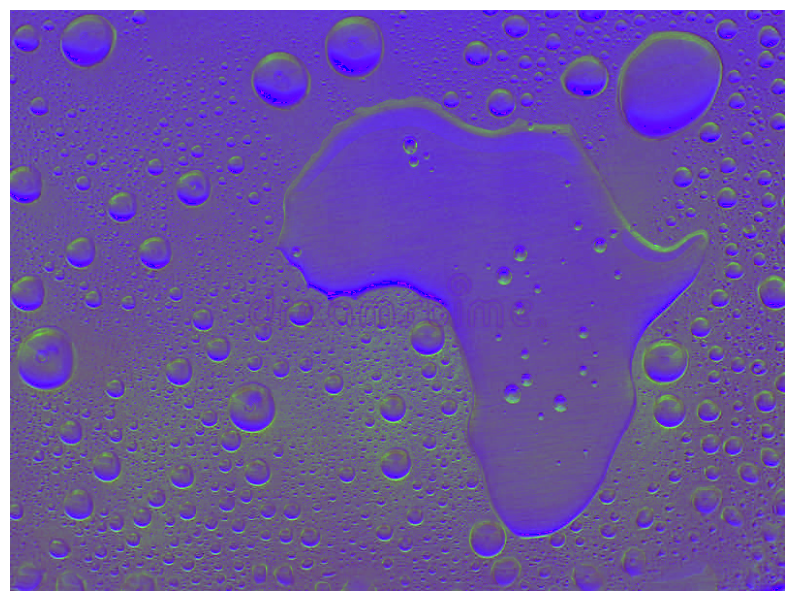

In [93]:
plt.figure(figsize=(10,10))
plt.imshow(hsv)
plt.axis('off');

Het wordt pas interessant wanneer we de kleur kanalen apart weergeven.

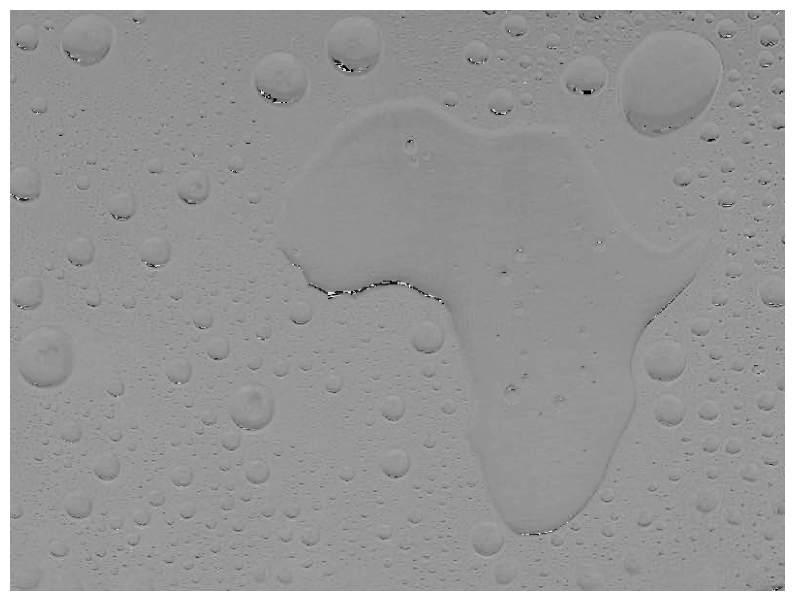

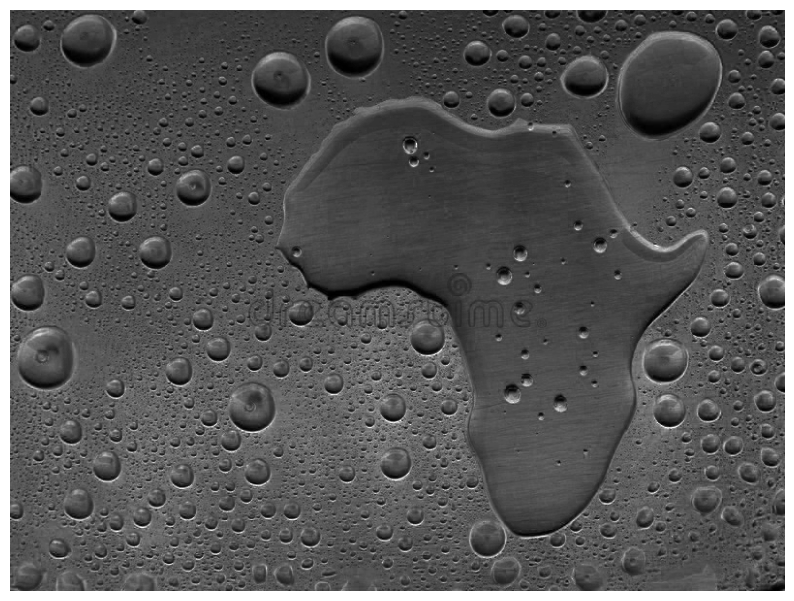

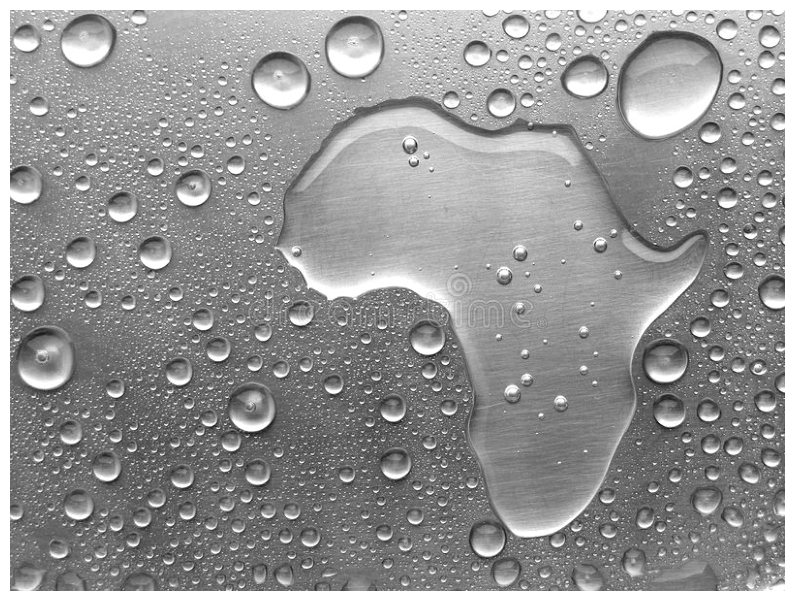

In [94]:
plt.figure(figsize=(10,10))
plt.imshow(hsv[:,:,0], cmap='gray')
plt.axis('off');
plt.figure(figsize=(10,10))
plt.imshow(hsv[:,:,1], cmap='gray')
plt.axis('off');
plt.figure(figsize=(10,10))
plt.imshow(hsv[:,:,2], cmap='gray')
plt.axis('off');

Kijk wat er nu veranderd is, wanneer we Canny op de losse kleur kanalen toepassen.

In [104]:
h_edges = cv.Canny(hsv[:,:,0], 10, 40, 3, 3, True)

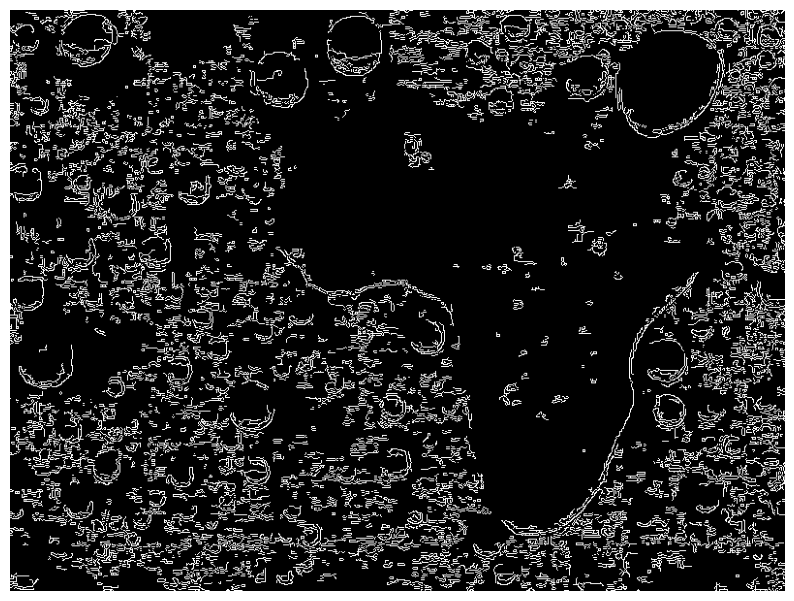

In [105]:
plt.figure(figsize=(10,10))
plt.imshow(h_edges, cmap='gray')
plt.axis('off');

In [97]:
h_edges_1 = cv.Canny(hsv[:,:,1], 10, 40, 3, 3, True)

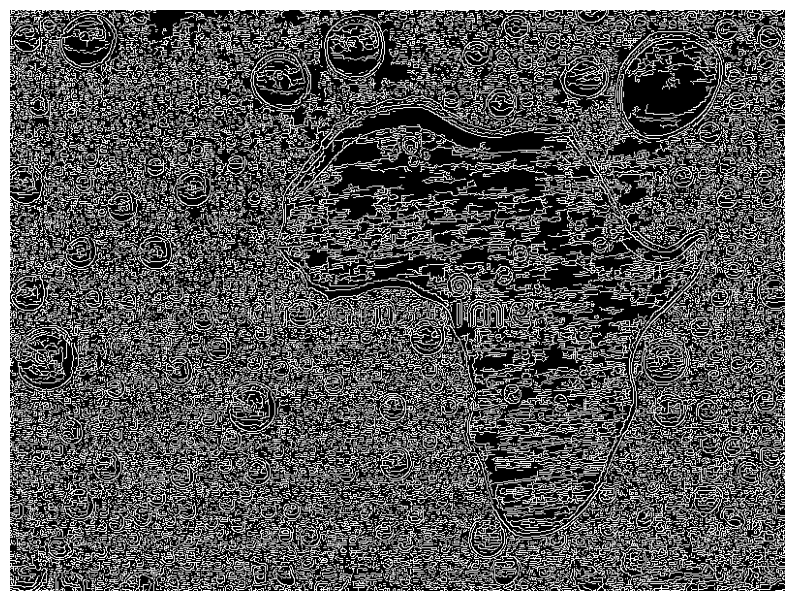

In [99]:
plt.figure(figsize=(10,10))
plt.imshow(h_edges_1, cmap='gray')
plt.axis('off');

In [100]:
h_edges_2 = cv.Canny(hsv[:,:,2], 10, 40, 3, 3, True)

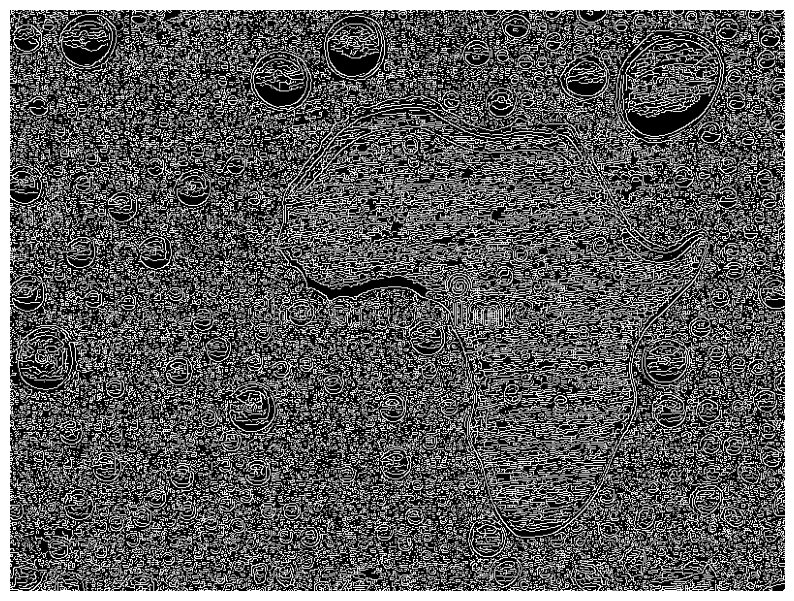

In [101]:
plt.figure(figsize=(10,10))
plt.imshow(h_edges_2, cmap='gray')
plt.axis('off');

## Importeer en toon afbeelding

Zoek een kleuren foto met 7 gezichten of meer.

Laad de afbeelding in.

Laat de foto op het scherm zien. Hoeveel gezichten zie je zelf?
 
Hint: `imread`, `imshow` uit de matplotlib library

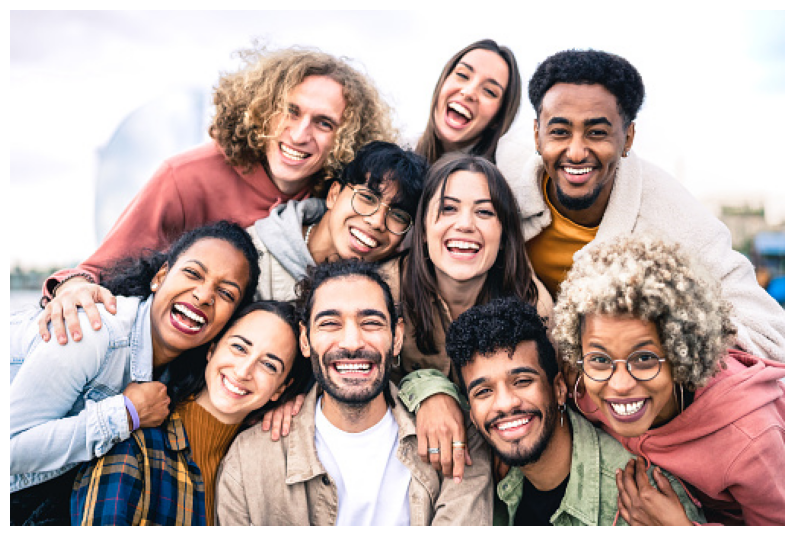

In [223]:
#open image an convert to numpy array
img = plt.imread('assets/faces.jpg')  

plt.figure(figsize=(10,10))
plt.imshow(img)
plt.axis('off');

Welk datatype heeft de ingeladen afbeelding?


Hoe groot is de afbeelding in pixels?

In [224]:
print("De datatype is {}".format(type(img)))
print("De grootte in pixels is {}".format(img.shape))


De datatype is <class 'numpy.ndarray'>
De grootte in pixels is (339, 509, 3)


## Zet een kleurenplaatje om in een grijswaarde plaatje.

Als je foto al zwart-wit is dan kun je deze stap overslaan.

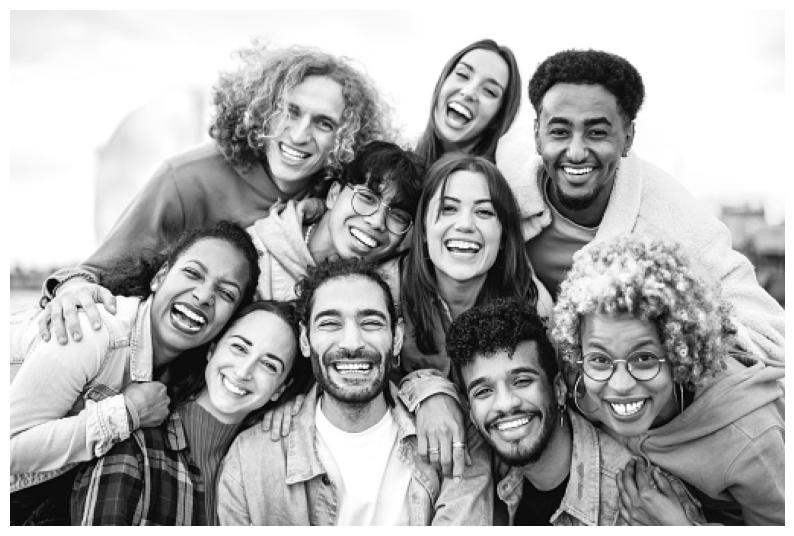

In [225]:
# foto naar grijs zetten
gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)

plt.figure(figsize=(10,10))
plt.imshow(gray, cmap='gray')
plt.axis('off');

In [226]:
gray.shape

(339, 509)

## Initieer detector

Zoek het pad van de .xml file met de classifier: haarcascade_frontalface_default.xml

Initieer de Cascade Classifier.

In [227]:
face_cascade = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')

print("Is de classifier leeg? --> " + str(face_cascade.empty()) + "  (moet 'False', dus 'niet leeg', zijn)")

Is de classifier leeg? --> False  (moet 'False', dus 'niet leeg', zijn)


## Detecteer gezichten

Bepaal met de classifier ``face_cascade.detectMultiScale()`` de gezichten in het plaatje.

Hoeveel heb je er gevonden?

In [240]:
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=1)

print("Aantal gezichten in de grijze foto: " + str(faces.shape[0]))

Aantal gezichten in de grijze foto: 10


In [241]:
# voor het testen 
print("Antal gezichten in de gekleurde foto: {}".format(str(faces.shape[0])))

Antal gezichten in de gekleurde foto: 10


## Toon rechthoeken rond gezichten

Toon rechthoeken om de gevonden gezichten.

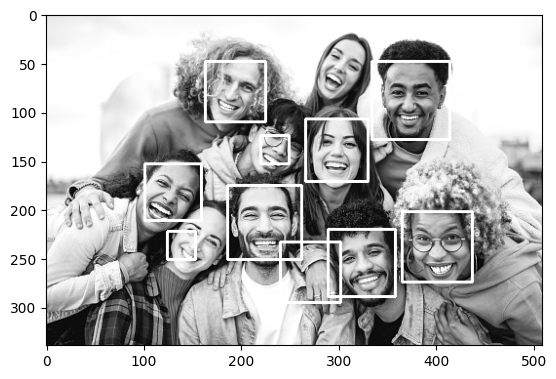

In [242]:
# teken rechthoeken rond de herkende gezichten
for (x, y, w, h) in faces:
    cv.rectangle(gray, (x, y), (x + w, y + h), (255, 255, 0), 2)

plt.imshow(gray, cmap='gray')

## Evalueer de resultaten

Hoe goed is jouw detector in vergelijking met wat je zelf ziet?

- Zo als we op de foto kunnen zien heeft de detector zijn best gedaan (zonder varrieren van parameters) om 8 gezichten van de 10 te herkennen waarvan één een hand is. Dus in dit specifieke geval is de detector niet beter dan mijn egigen ogen.

Kun je de parameters van `face_cascade.detectMultiScale` varieren zodat de detectie beter wordt?

- Ik heb de parameters gevarieerd maar het ging alleen maar slechter.

## Bonus 1: detecteer ook de ogen en de mond

Hint: er zijn nog meer .xml files met detectoren

In [243]:
# deze heb ik gedaan om te kijken waar de haarcascade files zijn, want eerst gebruikte ik de "mouth_cascade.xml" maar daar stond
# deze file niet. Ik koos haarcascade_smile.xml in plaats daarvan.
print(cv.data.haarcascades)

# Laad het eye cascade classifier
eye_cascade = cv.CascadeClassifier(cv.data.haarcascades + "haarcascade_eye.xml")
print("Is de classifier leeg? --> " + str(eye_cascade.empty()) + "  (moet 'False', dus 'niet leeg', zijn)")

# laad het mouth(glimlach) cascade classifier
mouth_cascade = cv.CascadeClassifier(cv.data.haarcascades + "haarcascade_smile.xml")

print("Is de classifier leeg? --> " + str(mouth_cascade.empty()) + "  (moet 'False', dus 'niet leeg', zijn)")

C:\Users\Aghoo\AppData\Local\Programs\Python\Python310\lib\site-packages\cv2\data\
Is de classifier leeg? --> False  (moet 'False', dus 'niet leeg', zijn)
Is de classifier leeg? --> False  (moet 'False', dus 'niet leeg', zijn)


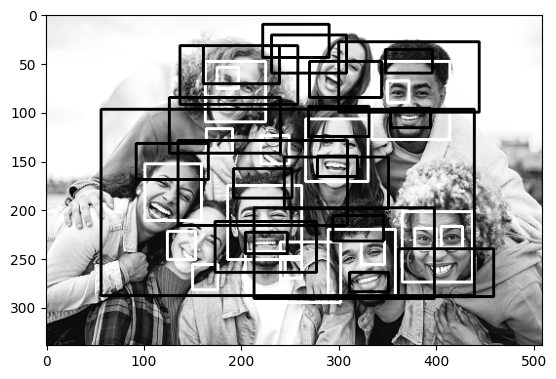

In [244]:
# detecteer ogen
eyes = eye_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=1)

# teken rechthoeken rond de ogen
for (x, y, w, h) in eyes:
    cv.rectangle(gray, (x, y), (x + w, y + h), (255, 0, 0), 2)

# detecteer mond(glimlach)
mouth = mouth_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=1)

# teken rechthoeken rond de monden
for (x, y, w, h) in mouth:
    cv.rectangle(gray, (x, y), (x + w, y + h), (0, 0, 255), 2)
    
plt.imshow(gray, cmap='gray')

## Bonus 2: analyseer de afbeeldingen uit je webcam

Hint: ``VideoCapture()`` uit de ``OpenCV`` library

In [247]:
# Initialiseren van de webcam
cap = cv.VideoCapture(0)

while True:
    # Lezen van het volgende frame uit de webcam
    ret, frame = cap.read()

    # Omzetten van het frame naar grijswaarden
    gray = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)

    # Detecteren van gezichten in het frame
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)

    # Tekenen van rechthoeken rond de gedetecteerde gezichten
    for (x, y, w, h) in faces:
        cv.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 0), 2)

    # Tonen van het frame met gedetecteerde gezichten
    cv.imshow("Mijn webcam", frame)

    # Afbreken van de loop als de 'q' toets wordt ingedrukt
    if cv.waitKey(1) & 0xFF == ord('q'):
        break

# Vrijgeven van de webcam en sluiten van het venster
cap.release()
cv.destroyAllWindows()